#Zomato Delivery Operations Analytics

# 1. Data Preparation & Understanding

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
pd.set_option("display.max_columns", None) # show all columns
pd.set_option("display.max_rows", None) # show all rows

In [ ]:
df_zomato = pd.read_csv('/content/drive/MyDrive/Final project Take Home Test dibimbing/Data Analysis/Zomato Dataset.csv')
df_zomato.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,12-02-2022,21:55,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,13-02-2022,14:55,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,04-03-2022,17:30,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,13-02-2022,09:20,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,14-02-2022,19:50,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [ ]:
df_zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45584 non-null  object 
 1   Delivery_person_ID           45584 non-null  object 
 2   Delivery_person_Age          43730 non-null  float64
 3   Delivery_person_Ratings      43676 non-null  float64
 4   Restaurant_latitude          45584 non-null  float64
 5   Restaurant_longitude         45584 non-null  float64
 6   Delivery_location_latitude   45584 non-null  float64
 7   Delivery_location_longitude  45584 non-null  float64
 8   Order_Date                   45584 non-null  object 
 9   Time_Orderd                  43853 non-null  object 
 10  Time_Order_picked            45584 non-null  object 
 11  Weather_conditions           44968 non-null  object 
 12  Road_traffic_density         44983 non-null  object 
 13  Vehicle_conditio

File `Zomato Datset.csv` contain some of columns which each of them consist of  different contiment in zomato delivery dataset. Here'se some of information abouth this dataset:

| Nama Kolom                  | Deskripsi                                |
|-----------------------------|------------------------------------------|
| ID                          | Unique identifier for each delivery.     |
| Delivery_person_ID          | Unique identifier for each delivery person|
| Delivery_person_Age         | Age of the delivery person               |
| Delivery_person_Ratings     | Ratings assigned to the delivery person  |
| Restaurant_latitude         | Latitude of the restaurant               |
| Restaurant_longitude        | Longitude of the restaurant              |
| Delivery_location_latitude  | Latitude of the delivery location        |
| Delivery_location_longitude | Longitude of the delivery location       |
| Order_Date                  | Date of the order                        |
| Time_Ordered                | Time the order was placed                |
| Time_Order_picked           | Time the order was picked up for delivery|
|Weather_conditions           | Weather conditions at the time of delivery|
|Road_traffic_density         | Density of road traffic during delivery  |
|Vehicle_condition            | Condition of the delivery vehicle        |
|Type_of_order                | Type of order (e.g., dine-in, takeaway, delivery) |
|Type_of_vehicle              | Type of vehicle used for delivery        |
|Multiple_deliveries          | Indicator of whether multiple deliveries were made in the same trip |
|Festival                     | Indicator of whether the delivery coincided with a festival |
|City                         | City where the delivery took place       |
|Time_taken (min)             | Time taken for delivery in minutes       |


Based on that dataset, we're had the goals on it. The goals that i want to do is to determine which of some components that really makes people or customer really satisfied or not that makes the company to take the next level step when its already found solution.

# 2. Data Cleaning

## A. Handling Duplicate Data

In [ ]:
len(df_zomato.drop_duplicates()) / len(df_zomato)
#jika output dari code di cell ini tidak bernilai 1 maka terdapat duplikat

1.0

There's no any duplicate

## B. Handling Missing Value

In [ ]:
# Pastikan kolom Time_taken (min) jadi numeric
#df_zomato['Time_taken (min)'] = pd.to_numeric(df_zomato['Time_taken (min)'], errors='coerce')

In [ ]:
df_zomato.isnull().sum()

,0
ID,0
Delivery_person_ID,0
Delivery_person_Age,1854
Delivery_person_Ratings,1908
Restaurant_latitude,0
Restaurant_longitude,0
Delivery_location_latitude,0
Delivery_location_longitude,0
Order_Date,0
Time_Orderd,1731


In [ ]:
for column in df_zomato.columns:
    print(f"============= {column} =================")
    display(df_zomato[column].value_counts())
    print()

============= ID =================


,count
ID,
0x2bed,1
0x91d5,1
0x90c5,1
0x6997,1
0x1a92,1
0x1b0d,1
0xc7a7,1
0x1de4,1
0xaec7,1



============= Delivery_person_ID =================


,count
Delivery_person_ID,
PUNERES01DEL01,67
JAPRES11DEL02,67
HYDRES04DEL02,66
JAPRES03DEL01,66
VADRES08DEL02,66
RANCHIRES02DEL01,66
VADRES11DEL02,66
SURRES11DEL01,65
BANGRES07DEL02,65



============= Delivery_person_Age =================


,count
Delivery_person_Age,
35.0,2261
36.0,2260
37.0,2226
30.0,2226
38.0,2218
24.0,2210
32.0,2201
22.0,2194
29.0,2191



============= Delivery_person_Ratings =================


,count
Delivery_person_Ratings,
4.8,7146
4.7,7140
4.9,7040
4.6,6938
5.0,3996
4.5,3302
4.1,1430
4.2,1418
4.3,1409



============= Restaurant_latitude =================


,count
Restaurant_latitude,
0.000000,3640
26.911378,182
26.914142,180
26.902940,176
26.902908,176
26.892312,176
26.888420,174
26.913726,173
26.905287,173



============= Restaurant_longitude =================


,count
Restaurant_longitude,
0.000000,3640
75.789034,182
75.805704,181
75.793007,177
75.792934,176
75.806896,176
75.800689,174
75.752820,174
75.794592,173



============= Delivery_location_latitude =================


,count
Delivery_location_latitude,
0.130000,341
0.020000,337
0.090000,336
0.060000,336
0.040000,335
0.070000,335
0.110000,328
0.050000,328
0.010000,327



============= Delivery_location_longitude =================


,count
Delivery_location_longitude,
0.130000,341
0.020000,337
0.090000,336
0.060000,336
0.040000,335
0.070000,335
0.110000,328
0.050000,328
0.010000,327



============= Order_Date =================


,count
Order_Date,
15-03-2022,1192
03-04-2022,1178
13-03-2022,1169
26-03-2022,1165
24-03-2022,1162
09-03-2022,1159
05-04-2022,1156
05-03-2022,1154
07-03-2022,1153



============= Time_Orderd =================


,count
Time_Orderd,
21:55,461
17:55,456
0.833333333,449
22:20,448
21:35,446
19:50,444
21:15,442
22:45,438
21:20,437



============= Time_Order_picked =================


,count
Time_Order_picked,
21:30,495
22:50,474
22:40,458
18:40,457
21:45,456
17:55,456
22:25,455
18:05,454
20:50,453



============= Weather_conditions =================


,count
Weather_conditions,
Fog,7653
Stormy,7584
Cloudy,7533
Sandstorms,7494
Windy,7422
Sunny,7282



============= Road_traffic_density =================


,count
Road_traffic_density,
Low,15476
Jam,14139
Medium,10945
High,4423



============= Vehicle_condition =================


,count
Vehicle_condition,
2,15031
1,15028
0,15005
3,520



============= Type_of_order =================


,count
Type_of_order,
Snack,11530
Meal,11456
Drinks,11321
Buffet,11277



============= Type_of_vehicle =================


,count
Type_of_vehicle,
motorcycle,26429
scooter,15273
electric_scooter,3814
bicycle,68



============= multiple_deliveries =================


,count
multiple_deliveries,
1.0,28151
0.0,14094
2.0,1985
3.0,361



============= Festival =================


,count
Festival,
No,44460
Yes,896



============= City =================


,count
City,
Metropolitian,34087
Urban,10133
Semi-Urban,164



============= Time_taken (min) =================


,count
Time_taken (min),
26,2121
25,2050
27,1976
28,1965
29,1956
19,1824
15,1810
18,1765
16,1706


In [ ]:
df_zomato[df_zomato.isna().any(axis=1)]

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
8,0x6f67,HYDRES14DEL01,34.0,4.9,17.426228,78.407495,17.496228,78.477495,20-03-2022,20:40,20:50,Cloudy,Jam,0,Snack,motorcycle,NaN,No,Metropolitian,41
33,0x4f0,MUMRES17DEL02,NaN,NaN,19.121999,72.908493,19.201999,72.988493,06-04-2022,NaN,18:35,Cloudy,Medium,1,Drinks,scooter,1.0,No,Metropolitian,33
49,0xb002,JAPRES14DEL01,32.0,4.5,26.888420,75.800689,26.898420,75.810689,26-03-2022,09:25,09:40,Windy,Low,2,Buffet,scooter,0.0,No,NaN,20
65,0xa9f,BANGRES13DEL01,NaN,NaN,12.935662,77.614130,12.975662,77.654130,11-03-2022,NaN,15:30,NaN,NaN,1,Drinks,scooter,0.0,No,Metropolitian,19
77,0x837c,PUNERES14DEL02,39.0,4.8,18.516216,73.842527,18.566216,73.892527,03-03-2022,21:55,22:10,Stormy,Jam,1,Meal,motorcycle,NaN,No,Metropolitian,28
86,0xb437,SURRES16DEL01,25.0,5.0,21.160437,72.774209,21.270437,72.884209,18-03-2022,20:25,20:40,Stormy,Jam,1,Meal,motorcycle,NaN,No,Metropolitian,15
107,0x4beb,MYSRES08DEL01,20.0,4.8,12.297954,76.665169,12.307954,76.675169,30-03-2022,09:15,09:30,Cloudy,Low,0,Drinks,motorcycle,0.0,No,NaN,16
111,0x6e2,VADRES06DEL01,NaN,NaN,22.312790,73.170283,22.422790,73.280283,02-04-2022,NaN,18:25,NaN,NaN,3,Snack,electric_scooter,0.0,No,Metropolitian,25
118,0xd0e5,KOLRES17DEL03,23.0,NaN,22.569358,88.433452,22.599358,88.463452,17-02-2022,23:25,23:35,Sunny,Low,0,Drinks,motorcycle,0.0,No,Metropolitian,15
126,0x894e,BANGRES12DEL02,28.0,4.8,12.939496,77.625999,12.989496,77.675999,24-03-2022,23:10,23:15,Fog,Low,1,Drinks,motorcycle,NaN,No,Metropolitian,18


Based on that data, there's no any weird filling for each column. So, we're gonna handle only for Nan value

In [ ]:
df_zomato.isna().sum()

,0
ID,0
Delivery_person_ID,0
Delivery_person_Age,1854
Delivery_person_Ratings,1908
Restaurant_latitude,0
Restaurant_longitude,0
Delivery_location_latitude,0
Delivery_location_longitude,0
Order_Date,0
Time_Orderd,1731


In [ ]:
# Menghitung persentase nilai NaN di kolom Delivery_person_Age
100 * len(df_zomato[df_zomato['Delivery_person_Age'].isna()]) / len(df_zomato)

4.067216567216567

In [ ]:
# Menghitung persentase nilai NaN di kolom Delivery_person_Ratings
100 * len(df_zomato[df_zomato['Delivery_person_Ratings'].isna()]) / len(df_zomato)

4.185679185679185

In [ ]:
# Menghitung persentase nilai NaN di kolom Time_Orderd
100 * len(df_zomato[df_zomato['Time_Orderd'].isna()]) / len(df_zomato)

3.7973850473850472

In [ ]:
# Menghitung persentase nilai NaN di kolom Weather_conditions
100 * len(df_zomato[df_zomato['Weather_conditions'].isna()]) / len(df_zomato)

1.3513513513513513

In [ ]:
# Menghitung persentase nilai NaN di kolom Road_traffic_density
100 * len(df_zomato[df_zomato['Road_traffic_density'].isna()]) / len(df_zomato)

1.3184450684450684

In [ ]:
# Menghitung persentase nilai NaN di kolom multiple_deliveries
100 * len(df_zomato[df_zomato['multiple_deliveries'].isna()]) / len(df_zomato)

2.178395928395928

In [ ]:
# Menghitung persentase nilai NaN di kolom festival
100 * len(df_zomato[df_zomato['Festival'].isna()]) / len(df_zomato)

0.5001755001755002

In [ ]:
# Menghitung persentase nilai NaN di kolom city
100 * len(df_zomato[df_zomato['City'].isna()]) / len(df_zomato)

2.6325026325026326

Based on the percent, the result of each null column is below of 20 %. So, we're gonna handled in numeric for median and category for modus.

In [ ]:
df_zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45584 non-null  object 
 1   Delivery_person_ID           45584 non-null  object 
 2   Delivery_person_Age          43730 non-null  float64
 3   Delivery_person_Ratings      43676 non-null  float64
 4   Restaurant_latitude          45584 non-null  float64
 5   Restaurant_longitude         45584 non-null  float64
 6   Delivery_location_latitude   45584 non-null  float64
 7   Delivery_location_longitude  45584 non-null  float64
 8   Order_Date                   45584 non-null  object 
 9   Time_Orderd                  43853 non-null  object 
 10  Time_Order_picked            45584 non-null  object 
 11  Weather_conditions           44968 non-null  object 
 12  Road_traffic_density         44983 non-null  object 
 13  Vehicle_conditio

In [ ]:
# Menghitung median Delivery_person_Age dari data pelatihan yang tidak bernilai -1 atau NaN pada data train
median_Delivery_person_Age = df_zomato[(~df_zomato['Delivery_person_Age'].isna())]['Delivery_person_Age'].median()
median_Delivery_person_Age

30.0

In [ ]:
# Menghitung median Delivery_person_Ratings dari data pelatihan yang tidak bernilai -1 atau NaN pada data train
median_Delivery_person_Ratings = df_zomato[(~df_zomato['Delivery_person_Ratings'].isna())]['Delivery_person_Ratings'].median()
median_Delivery_person_Ratings

4.7

In [ ]:
# Menghitung median multiple_deliveries dari data pelatihan yang tidak bernilai -1 atau NaN pada data train
median_multiple_deliveries = df_zomato[(~df_zomato['multiple_deliveries'].isna())]['multiple_deliveries'].median()
median_multiple_deliveries

1.0

In [ ]:
# Mengisi nilai missing (baik -1 maupun NaN) pada kolom Rating dengan pengetahuan median dari data train
df_zomato['Delivery_person_Age'] = df_zomato['Delivery_person_Age'].apply(lambda x: median_Delivery_person_Age if pd.isna(x) else x)

In [ ]:
# Mengisi nilai missing (baik -1 maupun NaN) pada kolom Rating dengan pengetahuan median dari data train
df_zomato['Delivery_person_Ratings'] = df_zomato['Delivery_person_Ratings'].apply(lambda x: median_Delivery_person_Ratings if pd.isna(x) else x)

In [ ]:
# Mengisi nilai missing (baik -1 maupun NaN) pada kolom Rating dengan pengetahuan median dari data train
df_zomato['multiple_deliveries'] = df_zomato['multiple_deliveries'].apply(lambda x: median_multiple_deliveries if pd.isna(x) else x)

In [ ]:
#Mode imputation Untuk Time_Orderd
mode_Time_Orderd = df_zomato[(~df_zomato['Time_Orderd'].isna())]['Time_Orderd'].mode()[0]
mode_Time_Orderd

'21:55'

In [ ]:
#Mode imputation Untuk Weather_conditions
mode_Weather_conditions = df_zomato[(~df_zomato['Weather_conditions'].isna())]['Weather_conditions'].mode()[0]
mode_Weather_conditions

'Fog'

In [ ]:
#Mode imputation Untuk Road_traffic_density
mode_Road_traffic_density = df_zomato[(~df_zomato['Road_traffic_density'].isna())]['Road_traffic_density'].mode()[0]
mode_Road_traffic_density

'Low'

In [ ]:
#Mode imputation Untuk Festival
mode_Festival = df_zomato[(~df_zomato['Festival'].isna())]['Festival'].mode()[0]
mode_Festival

'No'

In [ ]:
#Mode imputation Untuk City
mode_City = df_zomato[(~df_zomato['City'].isna())]['City'].mode()[0]
mode_City

'Metropolitian'

In [ ]:
#implement missing value imputation to train and test, from size mode value in train data
df_zomato['Time_Orderd'] = df_zomato['Time_Orderd'].apply(lambda x: mode_Time_Orderd if pd.isna(x) else x)

In [ ]:
#implement missing value imputation to train and test, from size mode value in train data
df_zomato['Weather_conditions'] = df_zomato['Weather_conditions'].apply(lambda x: mode_Weather_conditions if pd.isna(x) else x)

In [ ]:
#implement missing value imputation to train and test, from size mode value in train data
df_zomato['Road_traffic_density'] = df_zomato['Road_traffic_density'].apply(lambda x: mode_Road_traffic_density if pd.isna(x) else x)

In [ ]:
#implement missing value imputation to train and test, from size mode value in train data
df_zomato['Festival'] = df_zomato['Festival'].apply(lambda x: mode_Festival if pd.isna(x) else x)

In [ ]:
#implement missing value imputation to train and test, from size mode value in train data
df_zomato['City'] = df_zomato['City'].apply(lambda x: mode_City if pd.isna(x) else x)

In [ ]:
df_zomato.isna().sum()

,0
ID,0
Delivery_person_ID,0
Delivery_person_Age,0
Delivery_person_Ratings,0
Restaurant_latitude,0
Restaurant_longitude,0
Delivery_location_latitude,0
Delivery_location_longitude,0
Order_Date,0
Time_Orderd,0


In [ ]:
df_zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45584 non-null  object 
 1   Delivery_person_ID           45584 non-null  object 
 2   Delivery_person_Age          45584 non-null  float64
 3   Delivery_person_Ratings      45584 non-null  float64
 4   Restaurant_latitude          45584 non-null  float64
 5   Restaurant_longitude         45584 non-null  float64
 6   Delivery_location_latitude   45584 non-null  float64
 7   Delivery_location_longitude  45584 non-null  float64
 8   Order_Date                   45584 non-null  object 
 9   Time_Orderd                  45584 non-null  object 
 10  Time_Order_picked            45584 non-null  object 
 11  Weather_conditions           45584 non-null  object 
 12  Road_traffic_density         45584 non-null  object 
 13  Vehicle_conditio

Handling Missing Value is done

## C. Handling Outlier Data

In [ ]:
# untuk plot Q-Q
import scipy.stats as stats
numeric_columns = df_zomato.select_dtypes(include=['number']).columns
numeric_columns

Index(['Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Vehicle_condition',
       'multiple_deliveries', 'Time_taken (min)'],
      dtype='object')

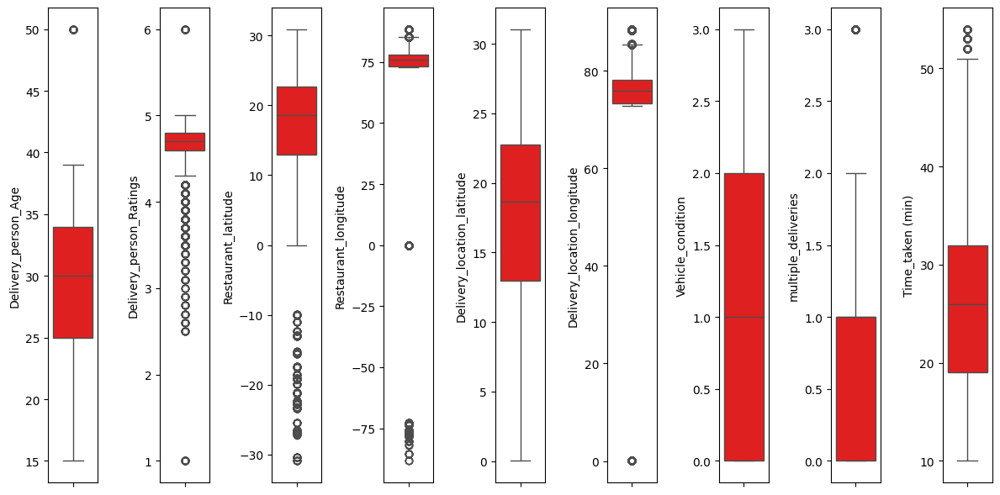

In [ ]:
# adjust the figure size for better readability
plt.figure(figsize=(12,6))

# plotting
for i in range(0, len(numeric_columns)):
    plt.subplot(1, len(numeric_columns), i+1)
    sns.boxplot(y=df_zomato[numeric_columns[i]], color='red')
    plt.tight_layout()

Based on outlier, this dataset have it, but it's still kinda normal not very worse (boxplot is smashed). So, we didn't handle that.

# Change Data Type and add some column

In [ ]:
df_zomato_1 = df_zomato.copy()
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,12-02-2022,21:55,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,13-02-2022,14:55,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,04-03-2022,17:30,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,13-02-2022,09:20,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,14-02-2022,19:50,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [ ]:
df_zomato_1 = df_zomato_1.drop(['Restaurant_latitude'], axis = 1)
df_zomato_1 = df_zomato_1.drop(['Restaurant_longitude'], axis = 1)
df_zomato_1 = df_zomato_1.drop(['Delivery_location_latitude'], axis = 1)
df_zomato_1 = df_zomato_1.drop(['Delivery_location_longitude'], axis = 1)
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,12-02-2022,21:55,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,13-02-2022,14:55,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,04-03-2022,17:30,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,13-02-2022,09:20,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,14-02-2022,19:50,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [ ]:
df_zomato_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       45584 non-null  object 
 1   Delivery_person_ID       45584 non-null  object 
 2   Delivery_person_Age      45584 non-null  float64
 3   Delivery_person_Ratings  45584 non-null  float64
 4   Order_Date               45584 non-null  object 
 5   Time_Orderd              45584 non-null  object 
 6   Time_Order_picked        45584 non-null  object 
 7   Weather_conditions       45584 non-null  object 
 8   Road_traffic_density     45584 non-null  object 
 9   Vehicle_condition        45584 non-null  int64  
 10  Type_of_order            45584 non-null  object 
 11  Type_of_vehicle          45584 non-null  object 
 12  multiple_deliveries      45584 non-null  float64
 13  Festival                 45584 non-null  object 
 14  City                  

In [ ]:
df_zomato_1['Order_Date'] = pd.to_datetime(df_zomato_1['Order_Date'], format="%d-%m-%Y")
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [ ]:
import pandas as pd
from datetime import datetime, timedelta

def parse_time_1(value):
    # Kalau value kosong/null
    if pd.isna(value):
        return None

    # Jika formatnya string dan mengandung "24:"
    if isinstance(value, str) and value.startswith("24:"):
        value = value.replace("24:", "00:")

    try:
        # Format HH:MM
        return pd.to_datetime(value, format="%H:%M", errors="raise").strftime("%H:%M:%S")
    except ValueError:
        try:
            # Format HH:MM:SS
            return pd.to_datetime(value, format="%H:%M:%S", errors="raise").strftime("%H:%M:%S")
        except ValueError:
            # Fraksi hari (float)
            fraction = float(value)
            return (datetime(1900, 1, 1) + timedelta(days=fraction)).strftime("%H:%M:%S")

In [ ]:
df_zomato_1["Time_Orderd"] = df_zomato_1["Time_Orderd"].apply(parse_time_1)
df_zomato_1.head(40)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41
5,0x3af3,MUMRES15DEL03,29.0,4.5,2022-04-02,20:25:00,20:35,Sandstorms,Jam,2,Buffet,electric_scooter,1.0,No,Metropolitian,20
6,0x3aab,MYSRES01DEL01,35.0,4.0,2022-03-01,14:55:00,15:10,Windy,High,1,Meal,scooter,1.0,No,Metropolitian,33
7,0x689b,PUNERES20DEL01,33.0,4.2,2022-03-16,20:30:00,20:40,Sandstorms,Jam,2,Snack,motorcycle,1.0,No,Metropolitian,40
8,0x6f67,HYDRES14DEL01,34.0,4.9,2022-03-20,20:40:00,20:50,Cloudy,Jam,0,Snack,motorcycle,1.0,No,Metropolitian,41
9,0xc9cf,KOLRES15DEL03,21.0,4.7,2022-02-15,21:15:00,21:30,Windy,Jam,0,Meal,motorcycle,1.0,No,Urban,15


In [ ]:
df_zomato_1["Time_Order_picked"] = df_zomato_1["Time_Order_picked"].apply(parse_time_1)
df_zomato_1.head(40)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41
5,0x3af3,MUMRES15DEL03,29.0,4.5,2022-04-02,20:25:00,20:35:00,Sandstorms,Jam,2,Buffet,electric_scooter,1.0,No,Metropolitian,20
6,0x3aab,MYSRES01DEL01,35.0,4.0,2022-03-01,14:55:00,15:10:00,Windy,High,1,Meal,scooter,1.0,No,Metropolitian,33
7,0x689b,PUNERES20DEL01,33.0,4.2,2022-03-16,20:30:00,20:40:00,Sandstorms,Jam,2,Snack,motorcycle,1.0,No,Metropolitian,40
8,0x6f67,HYDRES14DEL01,34.0,4.9,2022-03-20,20:40:00,20:50:00,Cloudy,Jam,0,Snack,motorcycle,1.0,No,Metropolitian,41
9,0xc9cf,KOLRES15DEL03,21.0,4.7,2022-02-15,21:15:00,21:30:00,Windy,Jam,0,Meal,motorcycle,1.0,No,Urban,15


In [ ]:
# 1. Ubah ke datetime penuh (pakai tanggal supaya bisa hitung)
df_zomato_1['Time_Orderd'] = pd.to_datetime(df_zomato_1['Order_Date'].astype(str) + ' ' + df_zomato_1['Time_Orderd'])
df_zomato_1['Time_Order_picked'] = pd.to_datetime(df_zomato_1['Order_Date'].astype(str) + ' ' + df_zomato_1['Time_Order_picked'])

# 2. Hitung selisih menit
#df_zomato_1['Time_Gap_Minutes'] = (df_zomato_1['Time_Order_picked'] - df_zomato_1['Time_Orderd']).dt.total_seconds() / 60
#df_zomato_1['Time_Gap_Hours'] = (df_zomato_1['Time_Order_picked'] - df_zomato_1['Time_Orderd']).dt.total_seconds() / 3600
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,2022-02-12 21:55:00,2022-02-12 22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,2022-02-13 14:55:00,2022-02-13 15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,2022-03-04 17:30:00,2022-03-04 17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,2022-02-13 09:20:00,2022-02-13 09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,2022-02-14 19:50:00,2022-02-14 20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [ ]:
df_zomato_1 = df_zomato_1[~((df_zomato_1['Order_Date'] == df_zomato_1['Time_Order_picked'].dt.date) & (df_zomato_1['Time_Orderd'] > df_zomato_1['Time_Order_picked']))]
df_zomato_1.head(40)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,2022-02-12 21:55:00,2022-02-12 22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,2022-02-13 14:55:00,2022-02-13 15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,2022-03-04 17:30:00,2022-03-04 17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,2022-02-13 09:20:00,2022-02-13 09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,2022-02-14 19:50:00,2022-02-14 20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41
5,0x3af3,MUMRES15DEL03,29.0,4.5,2022-04-02,2022-04-02 20:25:00,2022-04-02 20:35:00,Sandstorms,Jam,2,Buffet,electric_scooter,1.0,No,Metropolitian,20
6,0x3aab,MYSRES01DEL01,35.0,4.0,2022-03-01,2022-03-01 14:55:00,2022-03-01 15:10:00,Windy,High,1,Meal,scooter,1.0,No,Metropolitian,33
7,0x689b,PUNERES20DEL01,33.0,4.2,2022-03-16,2022-03-16 20:30:00,2022-03-16 20:40:00,Sandstorms,Jam,2,Snack,motorcycle,1.0,No,Metropolitian,40
8,0x6f67,HYDRES14DEL01,34.0,4.9,2022-03-20,2022-03-20 20:40:00,2022-03-20 20:50:00,Cloudy,Jam,0,Snack,motorcycle,1.0,No,Metropolitian,41
9,0xc9cf,KOLRES15DEL03,21.0,4.7,2022-02-15,2022-02-15 21:15:00,2022-02-15 21:30:00,Windy,Jam,0,Meal,motorcycle,1.0,No,Urban,15


In [ ]:
df_zomato_1['Time_Orderd'] = df_zomato_1['Time_Orderd'].dt.time
df_zomato_1['Time_Order_picked'] = df_zomato_1['Time_Order_picked'].dt.time
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [ ]:
df_zomato_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43399 entries, 0 to 45583
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ID                       43399 non-null  object        
 1   Delivery_person_ID       43399 non-null  object        
 2   Delivery_person_Age      43399 non-null  float64       
 3   Delivery_person_Ratings  43399 non-null  float64       
 4   Order_Date               43399 non-null  datetime64[ns]
 5   Time_Orderd              43399 non-null  object        
 6   Time_Order_picked        43399 non-null  object        
 7   Weather_conditions       43399 non-null  object        
 8   Road_traffic_density     43399 non-null  object        
 9   Vehicle_condition        43399 non-null  int64         
 10  Type_of_order            43399 non-null  object        
 11  Type_of_vehicle          43399 non-null  object        
 12  multiple_deliveries      43399 non-nu

In [ ]:
df_zomato_1['Order_Date'].min()

Timestamp('2022-02-11 00:00:00')

In [ ]:
df_zomato_1['Order_Date'].max()

Timestamp('2022-04-06 00:00:00')

In [ ]:
#df_zomato_1['Time_Orderd'] = pd.to_datetime(df_zomato_1['Time_Orderd']).dt.strftime('%H:%M:%S')
#df_zomato_1['Time_Order_picked'] = pd.to_datetime(df_zomato_1['Time_Order_picked']).dt.strftime('%H:%M:%S')
#df_zomato_1.head()

In [ ]:
df_zomato_1['Month_Name'] = pd.DatetimeIndex(df_zomato_1['Order_Date']).month_name()
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),Month_Name
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46,February
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23,February
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21,March
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20,February
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41,February


In [ ]:
#Mengubah tipe data agar mudah dilakukan pengolahan data
#df_zomato_1 = df_zomato_1.astype({"Time_Gap_Minutes":'int'})
#df_zomato_1.info()

In [ ]:
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),Month_Name
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46,February
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23,February
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21,March
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20,February
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41,February


In [ ]:
# Fungsi untuk mengkategorikan waktu
def categorize_time(time):
    if time >= pd.to_datetime('05:00:00').time() and time < pd.to_datetime('12:00:00').time():
        return 'Morning'
    elif time >= pd.to_datetime('12:00:00').time() and time < pd.to_datetime('15:00:00').time():
        return 'Noon'
    elif time >= pd.to_datetime('15:00:00').time() and time < pd.to_datetime('18:00:00').time():
        return 'Afternoon'
    else:
        return 'Night'

In [ ]:
df_zomato_1['Days_Pick_Up'] = df_zomato_1['Time_Order_picked'].apply(categorize_time)
df_zomato_1.head(40)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),Month_Name,Days_Pick_Up
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46,February,Night
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23,February,Afternoon
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21,March,Afternoon
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20,February,Morning
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41,February,Night
5,0x3af3,MUMRES15DEL03,29.0,4.5,2022-04-02,20:25:00,20:35:00,Sandstorms,Jam,2,Buffet,electric_scooter,1.0,No,Metropolitian,20,April,Night
6,0x3aab,MYSRES01DEL01,35.0,4.0,2022-03-01,14:55:00,15:10:00,Windy,High,1,Meal,scooter,1.0,No,Metropolitian,33,March,Afternoon
7,0x689b,PUNERES20DEL01,33.0,4.2,2022-03-16,20:30:00,20:40:00,Sandstorms,Jam,2,Snack,motorcycle,1.0,No,Metropolitian,40,March,Night
8,0x6f67,HYDRES14DEL01,34.0,4.9,2022-03-20,20:40:00,20:50:00,Cloudy,Jam,0,Snack,motorcycle,1.0,No,Metropolitian,41,March,Night
9,0xc9cf,KOLRES15DEL03,21.0,4.7,2022-02-15,21:15:00,21:30:00,Windy,Jam,0,Meal,motorcycle,1.0,No,Urban,15,February,Night


In [ ]:
df_attract = pd.pivot_table(
    data = df_zomato_1,
    index = 'Order_Date',
    values = 'multiple_deliveries',
    aggfunc = 'sum'
).reset_index().sort_values(by='Order_Date', ascending = True)
df_attract

,Order_Date,multiple_deliveries
0,2022-02-11,608.0
1,2022-02-12,701.0
2,2022-02-13,634.0
3,2022-02-14,702.0
4,2022-02-15,634.0
5,2022-02-16,689.0
6,2022-02-17,607.0
7,2022-02-18,689.0
8,2022-03-01,745.0
9,2022-03-02,803.0


In [ ]:
df_attract['Percentage'] = (df_attract['multiple_deliveries'] / df_attract['multiple_deliveries'].sum()) * 100
df_attract

,Order_Date,multiple_deliveries,Percentage
0,2022-02-11,608.0,1.865775
1,2022-02-12,701.0,2.151165
2,2022-02-13,634.0,1.945561
3,2022-02-14,702.0,2.154233
4,2022-02-15,634.0,1.945561
5,2022-02-16,689.0,2.114340
6,2022-02-17,607.0,1.862706
7,2022-02-18,689.0,2.114340
8,2022-03-01,745.0,2.286188
9,2022-03-02,803.0,2.464173


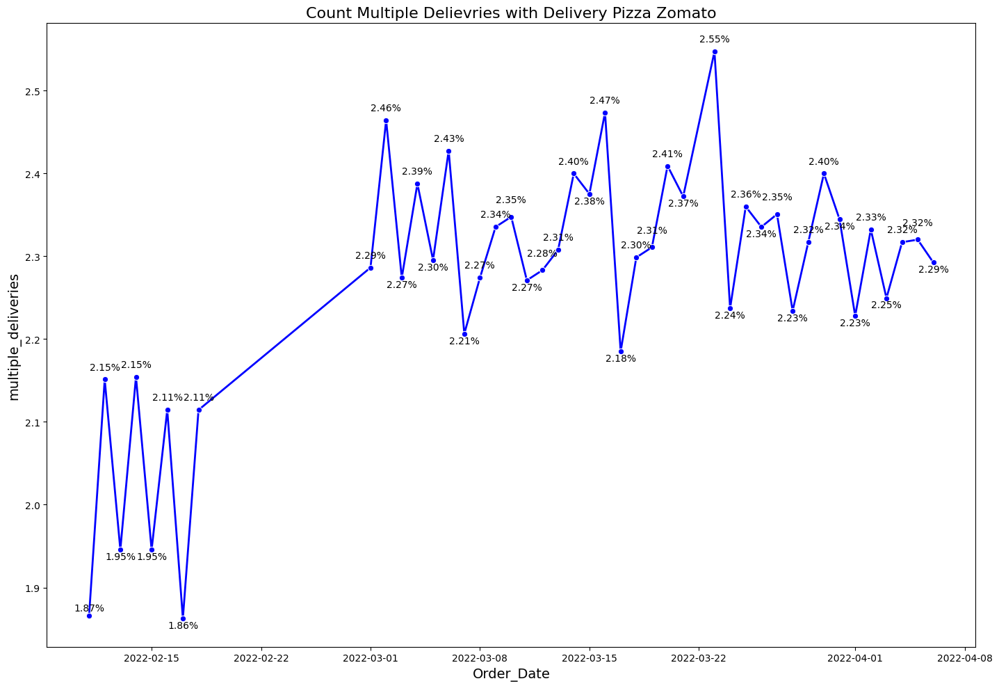

In [ ]:
# Visualisasi lineplot
plt.figure(figsize=(14.5, 10))
sns.lineplot(data=df_attract, x='Order_Date', y='Percentage', marker="o", color="blue", linewidth=2)

# Menambahkan angka dengan posisi otomatis
prev_y = None
for x, y in zip(df_attract['Order_Date'], df_attract['Percentage']):
    if prev_y is None:
        offset = 5  # titik pertama taruh di atas
    else:
        # kalau nilai hampir sama dengan titik sebelumnya, geser lebih jauh
        offset = 15 if abs(y - prev_y) < 0.02 else 10
        # geser ke atas atau ke bawah tergantung apakah nilainya lebih tinggi atau rendah
        offset = offset if y >= prev_y else -offset

    plt.annotate(f"{y:.2f}%", xy=(x, y), textcoords="offset points",
                 xytext=(0, offset), ha='center', color='black', fontsize=10)
    prev_y = y

# Menambahkan judul dan label
plt.title("Count Multiple Delievries with Delivery Pizza Zomato", fontsize=16)
plt.xlabel('Order_Date', fontsize=14)
plt.ylabel('multiple_deliveries', fontsize=14)
#plt.xticks(rotation=45)

plt.tight_layout()  # Menghindari elemen terpotong
plt.show()

# EDA / Business Problem

1. Which weather that possibly to be multiple deliveries based on type of order ?
2. Is time taken with delivery person ratings very strong correlation ? or there any another correlation that takes the previous pairs ? (numeric case)
3. In which Day that has more Averages peak minutes based on Type Of Vehicle ?
4. In which Road Traffic Density that has a lot of average delivery ratings based on City ?
5. In which age is possibly to be the bigest average vehicle condition based on festival ?

In [ ]:
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),Month_Name,Days_Pick_Up
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46,February,Night
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23,February,Afternoon
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21,March,Afternoon
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20,February,Morning
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41,February,Night


## No 4

4. In which Road Traffic Density that has a lot of average delivery ratings  based on City ?

In [ ]:
city_ratings = pd.pivot_table(
    data = df_zomato_1,
    index = ['Road_traffic_density', 'City'],
    values = 'Delivery_person_Ratings',
    aggfunc = 'mean'
).reset_index().sort_values(by ='Delivery_person_Ratings', ascending = False)
city_ratings

,Road_traffic_density,City,Delivery_person_Ratings
10,Medium,Urban,4.691373
2,High,Urban,4.686369
7,Low,Urban,4.684213
8,Medium,Metropolitian,4.652945
0,High,Metropolitian,4.647948
6,Low,Metropolitian,4.637500
5,Jam,Urban,4.630497
9,Medium,Semi-Urban,4.600000
3,Jam,Metropolitian,4.590154
4,Jam,Semi-Urban,4.511538


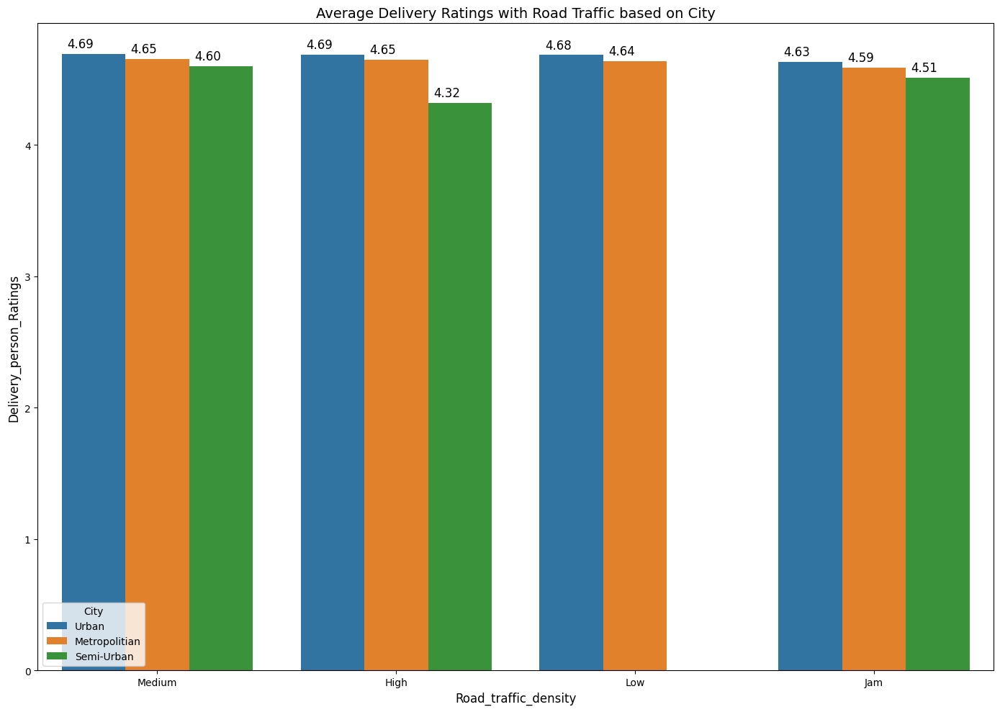

In [ ]:
plt.figure(figsize=(14, 10))
#total_amount_1 = city_ratings['Delivery_person_Ratings'].sum()

ax = sns.barplot(data = city_ratings, x='Road_traffic_density', y='Delivery_person_Ratings', hue = 'City')#, palette={'F':'deepskyblue', 'M':'blue'})

# Set the title and labels
plt.title('Average Delivery Ratings with Road Traffic based on City', fontsize = 14)
plt.xlabel('Road_traffic_density', fontsize = 12)
plt.ylabel('Delivery_person_Ratings', fontsize = 12)
#plt.xticks(rotation=45, horizontalalignment='right')

# Set the background color to grey
#plt.gca().set_facecolor('grey')

# Add count labels to the bars

for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(
            text=format(height, '.2f'),
            xy=(p.get_x() + p.get_width() / 2, height),
            ha='right', va='center',
            xytext=(0, 10),
            textcoords='offset points',
            color='black',
            fontsize = 12
        )

plt.tight_layout()

In [ ]:
#fig = plt.subplots(figsize=(10, 6)) # membuat grafik pie chart terhadap customer churn dan tidak
#bagian = city_ratings['Road_traffic_density']
#weight = [2,3,2,3,2]
#weight = city_ratings['Delivery_person_Ratings']

#plt.pie(
#    x = weight,
#    labels = bagian,
#    autopct='%.2f%%',
#    pctdistance=0.7,
#    #weights = weight,
#    colors = ['deepskyblue', 'purple', 'darkorange', 'mediumblue'],
#    #autopct = lambda p: f'{p * sum(x) / 100:.2f}',
#    #wedgeprops=dict(width=0.5, edgecolor='black'),
    #explode=[0, 0, 0, 0, 0.5]  # Memisahkan bagian kecil (Loyal)
#)
#plt.title('Average Road Traffic by Delivery Ratings', fontsize = 14)
#plt.show()

## No 3

3. In which Days that has more average peak minutes based on Type Of Vehicle ?

In [ ]:
df_peak = pd.pivot_table(
    data = df_zomato_1,
    index = ['Days_Pick_Up', 'Type_of_vehicle'],
    values = 'Time_taken (min)',
    aggfunc = 'mean'
).reset_index().sort_values(by ='Time_taken (min)', ascending = False)
df_peak

,Days_Pick_Up,Type_of_vehicle,Time_taken (min)
8,Night,motorcycle,29.073500
11,Noon,motorcycle,28.946203
1,Afternoon,motorcycle,27.303941
6,Night,bicycle,25.833333
9,Night,scooter,25.830278
7,Night,electric_scooter,25.688195
12,Noon,scooter,24.890503
10,Noon,electric_scooter,24.829146
2,Afternoon,scooter,24.412201
0,Afternoon,electric_scooter,23.995122


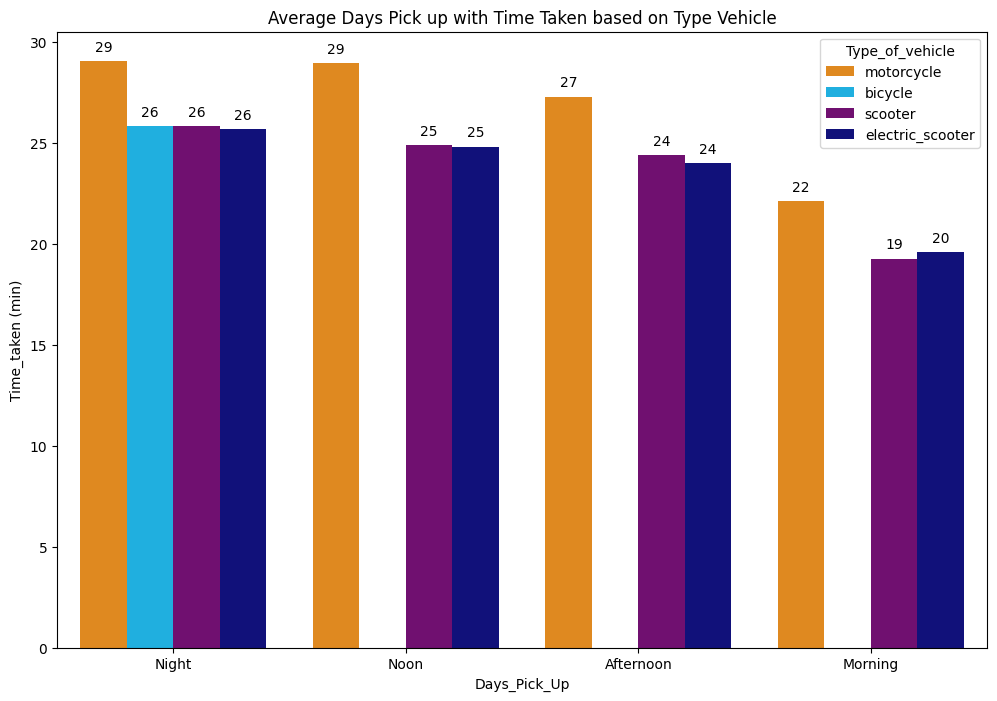

In [ ]:
# Create the bar chart with sorted values
# plt.style.use('dark_background')

plt.figure(figsize=(12, 8))

ax = sns.barplot(data=df_peak, x='Days_Pick_Up', y='Time_taken (min)', hue = 'Type_of_vehicle', palette={'motorcycle':'darkorange', 'bicycle':'deepskyblue', 'scooter':'purple', 'electric_scooter':'darkblue' })

# Set the title and labels
plt.title('Average Days Pick up with Time Taken based on Type Vehicle')
plt.xlabel('Days_Pick_Up')
plt.ylabel('Time_taken (min)')
#plt.xticks(rotation=45, horizontalalignment='right')

# Set the background color to grey
#plt.gca().set_facecolor('grey')

# Add count labels to the bars

for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(
            text=format(height, '.0f'),
            xy=(p.get_x() + p.get_width() / 2, height),
            ha='center', va='center',
            xytext=(0, 10),
            textcoords='offset points',
            color='black'
        )

## No 1

1. Which weather that possibly to be the biggest multiple deliveries based on type of order ?

In [ ]:
df_weather = pd.pivot_table(
    data = df_zomato_1,
    index = ['Weather_conditions','Type_of_order'],
    values = 'multiple_deliveries',
    aggfunc = 'sum'
).reset_index().sort_values(by ='multiple_deliveries', ascending = False)
df_weather

,Weather_conditions,Type_of_order,multiple_deliveries
7,Fog,Snack,1580.0
6,Fog,Meal,1552.0
5,Fog,Drinks,1514.0
1,Cloudy,Drinks,1499.0
2,Cloudy,Meal,1474.0
3,Cloudy,Snack,1455.0
4,Fog,Buffet,1446.0
0,Cloudy,Buffet,1433.0
14,Stormy,Meal,1420.0
13,Stormy,Drinks,1404.0


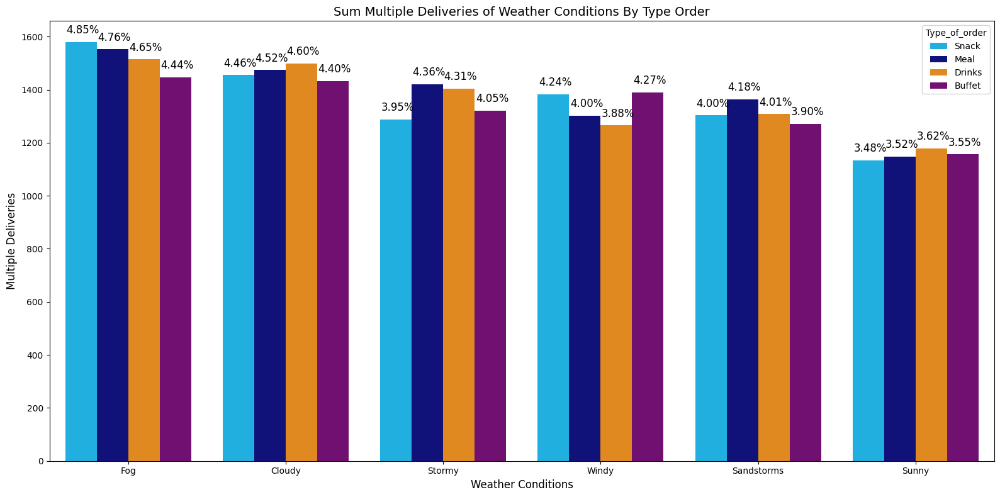

In [ ]:
# Create the bar chart with sorted values
# plt.style.use('dark_background')

plt.figure(figsize=(16, 8))
count_deliveries = df_weather['multiple_deliveries'].sum()

ax = sns.barplot(data= df_weather, x='Weather_conditions', y='multiple_deliveries', hue = 'Type_of_order', palette={'Snack':'deepskyblue', 'Meal':'darkblue', 'Drinks':'darkorange', 'Buffet':'purple'})

# Set the title and labels
plt.title('Sum Multiple Deliveries of Weather Conditions By Type Order', fontsize = 14)
plt.xlabel('Weather Conditions', fontsize = 12)
plt.ylabel('Multiple Deliveries', fontsize = 12)
#plt.xticks(rotation=45, horizontalalignment='right')

# Set the background color to grey
#plt.gca().set_facecolor('grey')

# Add count labels to the bars

for p in ax.patches:
    height = p.get_height()
    percent = (height / count_deliveries) * 100
    if height > 0:
        ax.annotate(
            f'{percent:.2f}%',
            xy=(p.get_x() + p.get_width() / 2, height),
            ha='center',
            va='bottom',  # agar teks dimulai tepat di atas bar
            xytext=(2, 7),  # sedikit jarak dari bar
            textcoords='offset points',
            fontsize=12,  # kecilkan biar rapi
            rotation=0,  # biar horizontal
            color='black'
        )

plt.tight_layout()

## No 2

2. is time taken with delivery person ratings very strong correlation ? or is there any another correlation that takes the previous pairs ? (numeric case)

In [ ]:
column_numeric = df_zomato_1.select_dtypes(include = 'number').columns
column_numeric

Index(['Delivery_person_Age', 'Delivery_person_Ratings', 'Vehicle_condition',
       'multiple_deliveries', 'Time_taken (min)'],
      dtype='object')

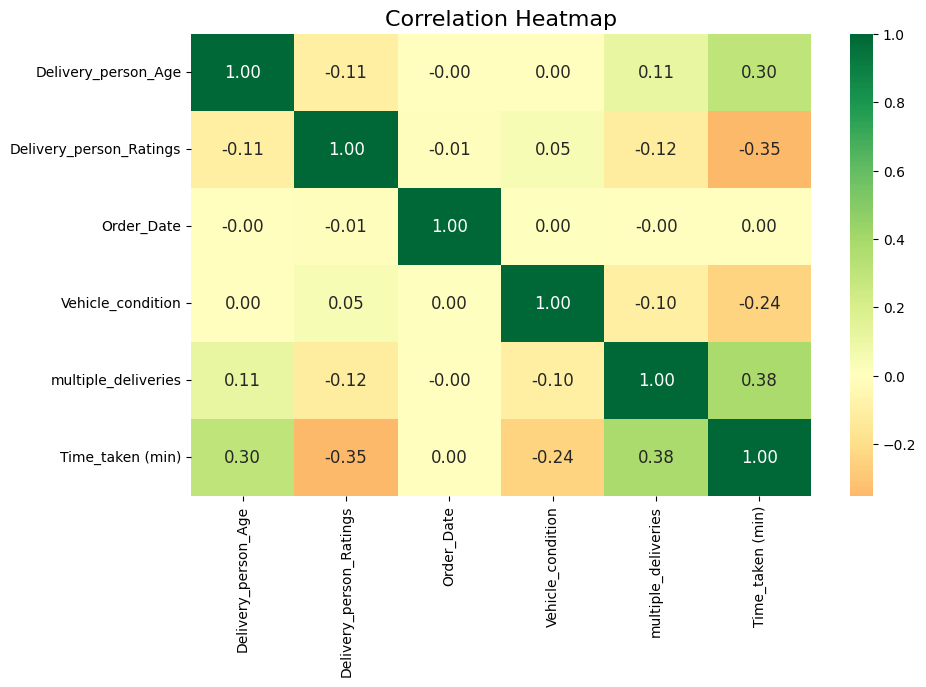

In [ ]:
# Compute the correlation matrix
correlation_matrix = df_zomato_1.select_dtypes(exclude = 'object').corr()
# Create the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix,
            cmap='RdYlGn',
            center=0,
            fmt=".2f",
            annot=True,
            annot_kws={"fontsize": 12},
            )
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

## No 5

5. In which age is possibly to be the bigest average vehicle condition based on festival ?

In [ ]:
df_age = pd.pivot_table(
    data = df_zomato_1,
    index = ['Delivery_person_Age','Festival'],
    values = 'Vehicle_condition',
    aggfunc = 'mean'
).reset_index().sort_values(by ='Delivery_person_Age', ascending = True)
df_age

,Delivery_person_Age,Festival,Vehicle_condition
0,15.0,No,3.000000
1,20.0,No,1.022115
2,20.0,Yes,0.391304
3,21.0,No,0.988055
4,21.0,Yes,0.333333
5,22.0,No,1.004690
6,22.0,Yes,0.545455
7,23.0,No,1.014815
8,23.0,Yes,0.562500
9,24.0,No,1.035564


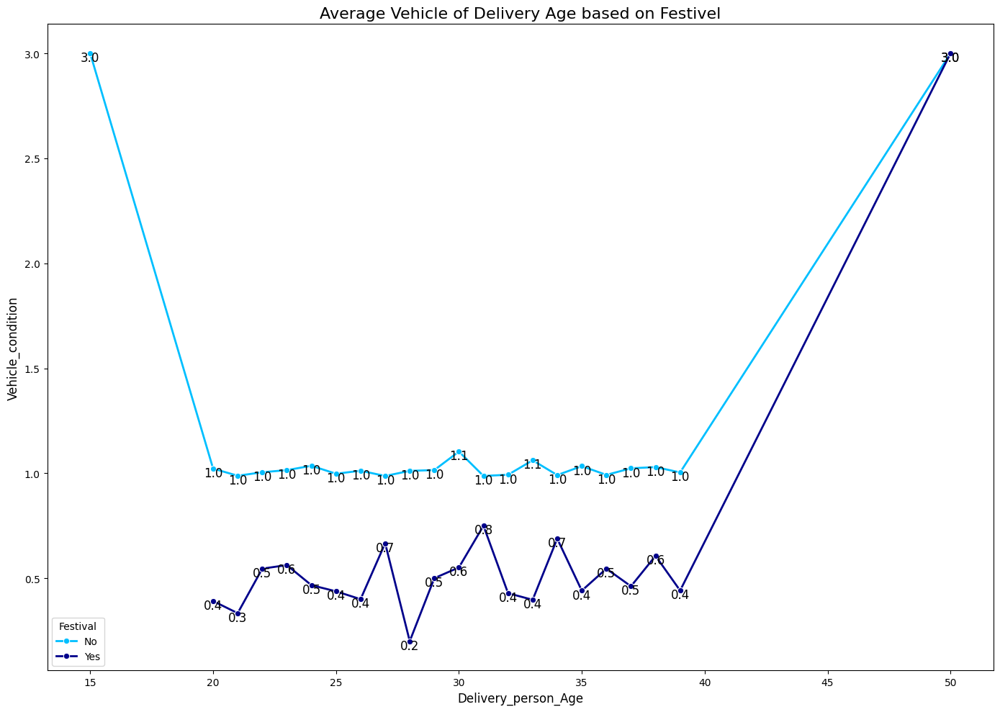

In [ ]:
# Visualisasi lineplot
plt.figure(figsize=(14, 10))
sns.lineplot(data= df_age, x='Delivery_person_Age', y='Vehicle_condition', hue = 'Festival', marker="o", linewidth=2, palette={'No':'deepskyblue', 'Yes':'darkblue'})

# Menambahkan angka di setiap titik (Opsional)
for x, y in zip(df_age['Delivery_person_Age'], df_age['Vehicle_condition']):
    plt.annotate(format(y, '.1f'), xy=(x, y), textcoords="offset points", xytext=(0, -8), ha='center', color='black', fontsize=12)

# Menambahkan judul dan label
plt.title("Average Vehicle of Delivery Age based on Festivel", fontsize=16)
plt.xlabel('Delivery_person_Age', fontsize=12)
plt.ylabel('Vehicle_condition', fontsize=12)
#plt.xticks(rotation=45)

plt.tight_layout()  # Menghindari elemen terpotong
plt.show()

In [ ]:
df_zomato_1.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),Days_Pick_Up
0,0xcdcd,DEHRES17DEL01,36.0,4.2,2022-02-12,21:55:00,22:10:00,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46,Night
1,0xd987,KOCRES16DEL01,21.0,4.7,2022-02-13,14:55:00,15:05:00,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23,Afternoon
2,0x2784,PUNERES13DEL03,23.0,4.7,2022-03-04,17:30:00,17:40:00,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21,Afternoon
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,2022-02-13,09:20:00,09:30:00,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20,Morning
4,0xdb64,KNPRES14DEL02,24.0,4.7,2022-02-14,19:50:00,20:05:00,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41,Night


# Download Data to make Dashboard in Power BI

In [ ]:
# Where is your data_path
data_path = '/content/drive/MyDrive/Final project Take Home Test dibimbing/'
df_zomato_1.to_csv(data_path + 'Zomato_Baru.csv', index = False)